# Smart Traffic Analytics System using Ultralytics YOLO

## Project Overview

The system analyzes road traffic footage to detect and track vehicles, measure traffic flow through vehicle counting, and generate visual traffic analytics. Detection and instance segmentation are additionally demonstrated as core computer-vision tasks before the full video analytics pipeline.

The project also includes custom YOLO fine-tuning on a vehicle dataset, model evaluation using standard object-detection metrics, and model export for deployment.

The complete pipeline includes:

- Object detection
- Instance segmentation
- Multi-object tracking
- Vehicle counting
- Custom dataset training
- Model validation and performance evaluation
- Error and threshold analysis
- Model export for deployment

The objective is to demonstrate a complete real-world computer vision workflow, from inference and video analytics through model training, evaluation, and deployment.

## Application Scenario

Traffic monitoring systems can automatically analyze road footage to provide information about vehicle movement and traffic volume. In this project, YOLO is used to identify vehicles in road footage, maintain their identities across video frames, and count vehicles as they move through a defined region.

## Technology Stack

- Python
- Ultralytics YOLO
- OpenCV
- PyTorch
- Google Colab
- ONNX

## Training Program

This capstone project was developed as part of the **Computer Vision for Developers with Ultralytics** training program delivered through **SDAIA Academy**.

## 1. Environment Setup

This section prepares the Google Colab environment for the computer vision pipeline.

The project uses **Ultralytics**, which provides the YOLO models and APIs required for inference, tracking, training, validation, and model export.

The **Roboflow** package is installed to simplify access to the custom vehicle dataset used later for model fine-tuning.

The installation is performed directly inside the notebook to make the project reproducible in a clean Google Colab environment.

In [1]:
!pip install -q ultralytics roboflow

### 1.1 Import Required Libraries

The required Python libraries are imported below.

- **YOLO** from Ultralytics provides access to pretrained and custom YOLO models.
- **OpenCV (`cv2`)** is used for image and video processing, including reading frames, drawing results, and writing processed video.
- **os** provides utilities for working with files and directories.
- **ultralytics** is imported separately to verify that the environment and dependencies are configured correctly.

These libraries form the foundation of the inference, video analytics, training, evaluation, and deployment pipeline implemented in this notebook.

In [2]:
from ultralytics import YOLO
import ultralytics
import cv2
import os

### 1.2 Environment Verification

Before running the computer vision pipeline, the Ultralytics environment is verified to ensure that the required dependencies are installed correctly.

The environment check reports information about the Python environment, PyTorch installation, available computing device, and other dependencies.

Using a GPU is preferred for this project because model training and video inference are computationally intensive. Google Colab GPU acceleration can significantly reduce processing and training time.

In [3]:
ultralytics.checks()

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.7/112.6 GB disk)


## 2. Object Detection Inference

The first stage of the computer vision pipeline demonstrates object detection using a pretrained Ultralytics YOLO model.

Object detection identifies objects within an image and localizes each detected object using a bounding box. Each prediction includes an object class, a confidence score, and bounding-box coordinates.

For this project, a pretrained YOLO model is first evaluated on a traffic scene to establish a baseline before custom model training. The inference results are captured and visualized to verify that the model can identify relevant road objects such as cars, buses, trucks, and motorcycles.

A confidence threshold is applied during inference to filter low-confidence predictions. The effect of confidence thresholds is analyzed later during model evaluation.

### 2.1 Load the Pretrained Model

A lightweight pretrained YOLO detection model is loaded using the Ultralytics Python API. The pretrained weights provide an initial object detector that can be used directly for inference before fine-tuning on the project-specific dataset.

In [4]:
model = YOLO("yolo11s.pt")

### 2.2 Traffic Video Input and Frame Extraction

A real-world traffic video is used as the primary input for the video analytics pipeline. The footage contains multiple road vehicles and provides a suitable scenario for subsequent object detection, tracking, and vehicle-counting experiments.

A representative frame is extracted from the video for image-based object detection and instance segmentation. Using a frame from the same video maintains consistency between the image inference and video analytics stages of the project.

In [5]:
video_path = "/content/traffic.mp4"

cap = cv2.VideoCapture(video_path)

# Read basic video properties
fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration = frame_count / fps

print(f"Resolution: {width}x{height}")
print(f"FPS: {fps:.2f}")
print(f"Frames: {frame_count}")
print(f"Duration: {duration:.2f} seconds")

cap.release()

Resolution: 1280x720
FPS: 25.00
Frames: 505
Duration: 20.20 seconds


### 2.3 Representative Frame Extraction

A representative frame is extracted from the midpoint of the traffic video for image-based inference.

Using a frame from the middle of the video increases the likelihood of capturing an active traffic scene containing multiple vehicles. The extracted frame is saved and subsequently used as a consistent input for both object detection and instance segmentation, enabling a direct comparison between the two computer vision tasks.

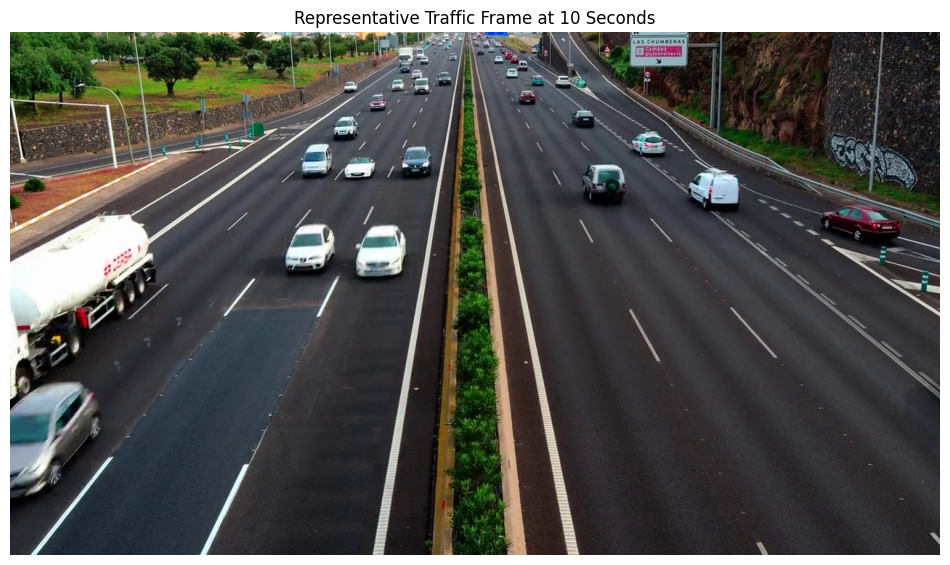

Frame successfully saved to: /content/traffic_frame.jpg


In [6]:
import matplotlib.pyplot as plt

# Open the traffic video
cap = cv2.VideoCapture(video_path)

# Move to approximately 10 seconds into the video
target_time = 10
cap.set(cv2.CAP_PROP_POS_MSEC, target_time * 1000)

# Read the selected frame
success, frame = cap.read()
cap.release()

if not success:
    raise RuntimeError("Could not extract the selected frame from the video.")

# Save the frame
traffic_image_path = "/content/traffic_frame.jpg"
cv2.imwrite(traffic_image_path, frame)

# Convert BGR (OpenCV) to RGB (Matplotlib)
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Display the frame
plt.figure(figsize=(12, 7))
plt.imshow(frame_rgb)
plt.title("Representative Traffic Frame at 10 Seconds")
plt.axis("off")
plt.show()

print(f"Frame successfully saved to: {traffic_image_path}")

### 2.4 Object Detection Inference

The pretrained YOLO11s detection model is applied to the representative traffic frame to establish a baseline for vehicle detection.

The model predicts object classes, confidence scores, and bounding-box coordinates for objects detected in the scene. A confidence threshold of 0.25 is used for the initial inference to retain detections with reasonable confidence while avoiding very low-confidence predictions.

The resulting annotated image is displayed and saved as evidence of the executed inference pipeline. The confidence threshold is examined further during the model evaluation stage.

In [7]:
detection_results = model.predict(
    source=traffic_image_path,
    conf=0.25,
    save=True,
    verbose=False
)

print("Detection inference completed successfully.")

Results saved to /content/runs/detect/predict-3
Detection inference completed successfully.


#### Detection Result

The annotated inference result below visualizes the objects detected by YOLO. Each bounding box identifies the predicted object class and its associated confidence score.

This output provides direct evidence that the pretrained detection model was successfully executed on the real traffic scene.

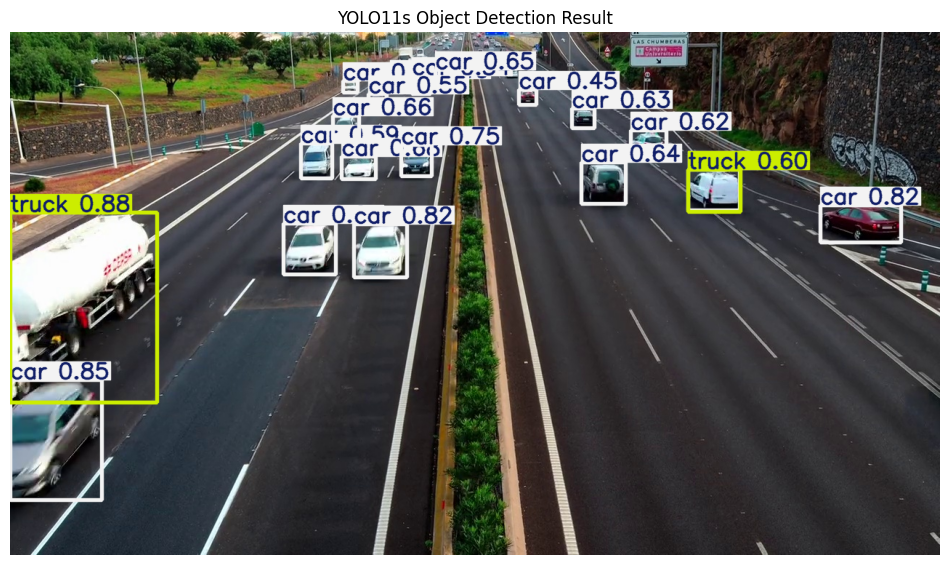

In [8]:
annotated_detection = detection_results[0].plot()

annotated_detection_rgb = cv2.cvtColor(
    annotated_detection,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(annotated_detection_rgb)
plt.title("YOLO11s Object Detection Result")
plt.axis("off")
plt.show()

### 2.5 Instance Segmentation for Vehicle Occupancy Analysis

Object detection is effective for identifying and localizing vehicles, but its rectangular bounding boxes also include background pixels such as the road and surrounding environment. For traffic analysis, a more precise representation of the area occupied by vehicles can provide additional spatial information about the traffic scene.

Therefore, **instance segmentation** is used as the second core vision task in this project. A task-specific YOLO11 segmentation model predicts a pixel-level mask for each detected vehicle, allowing the system to represent the actual visible area occupied by vehicles more precisely than bounding boxes alone.

In the context of this traffic analytics application, segmentation supports **vehicle occupancy and spatial traffic analysis**. The predicted masks can be used to estimate how much of the observed scene is occupied by vehicles, complementing the vehicle-counting and tracking information produced later in the video analytics pipeline.

The same representative traffic frame is used for both detection and segmentation so that the difference between bounding-box localization and pixel-level vehicle representation can be directly observed.

In [9]:
seg_model = YOLO("yolo11s-seg.pt")

segmentation_results = seg_model.predict(
    source=traffic_image_path,
    conf=0.25,
    save=True,
    verbose=False
)

print("Instance segmentation completed successfully.")

Results saved to /content/runs/segment/predict-2
Instance segmentation completed successfully.


#### Segmentation Result

The segmentation output displays an individual pixel-level mask for each detected object in addition to its predicted class and confidence score.

Compared with bounding-box detection, the segmentation masks provide a more detailed representation of vehicle boundaries. This demonstrates a second computer vision task using task-specific Ultralytics YOLO segmentation weights.

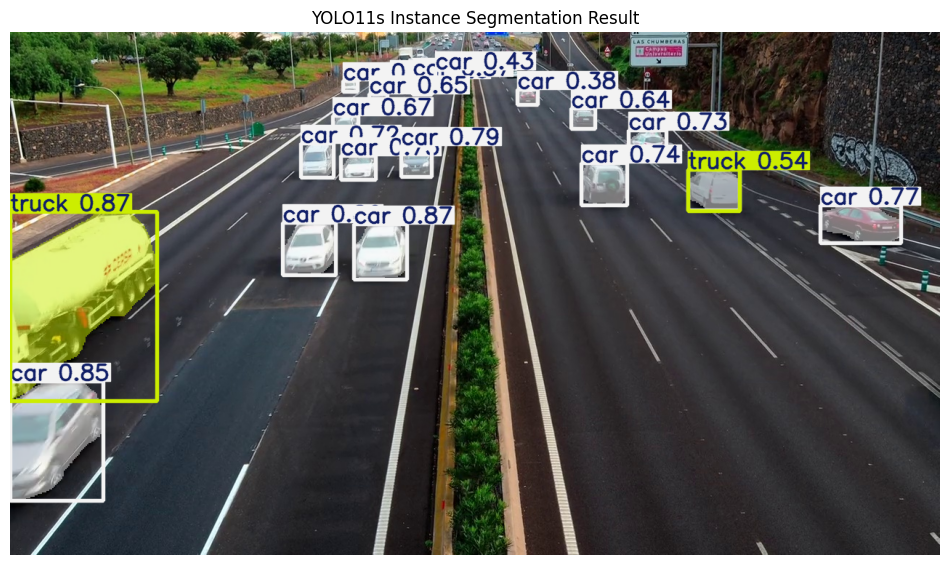

In [10]:
annotated_segmentation = segmentation_results[0].plot()

annotated_segmentation_rgb = cv2.cvtColor(
    annotated_segmentation,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(12, 7))
plt.imshow(annotated_segmentation_rgb)
plt.title("YOLO11s Instance Segmentation Result")
plt.axis("off")
plt.show()

### 2.6 Vehicle Occupancy Analysis

The instance segmentation masks are used to estimate the proportion of the image occupied by detected vehicles.

Unlike bounding boxes, segmentation masks represent the visible pixels belonging to each detected object. The masks of vehicle-related classes are therefore combined to calculate a simple **vehicle occupancy ratio** for the representative traffic frame.

The occupancy ratio is calculated as:

**Vehicle Occupancy (%) = Vehicle Mask Pixels / Total Image Pixels × 100**

This measurement complements vehicle counting by providing spatial information about how much of the observed traffic scene is occupied by vehicles.

In [11]:
import numpy as np

result = segmentation_results[0]

# COCO classes representing road vehicles
vehicle_classes = {"car", "motorcycle", "bus", "truck"}

vehicle_mask = np.zeros(
    (result.orig_shape[0], result.orig_shape[1]),
    dtype=bool
)

if result.masks is not None:
    masks = result.masks.data.cpu().numpy()
    class_ids = result.boxes.cls.cpu().numpy().astype(int)

    for mask, class_id in zip(masks, class_ids):
        class_name = result.names[class_id]

        if class_name in vehicle_classes:
            # Resize the mask to the original image resolution
            resized_mask = cv2.resize(
                mask,
                (result.orig_shape[1], result.orig_shape[0]),
                interpolation=cv2.INTER_NEAREST
            )

            vehicle_mask |= resized_mask > 0.5

vehicle_pixels = np.count_nonzero(vehicle_mask)
total_pixels = vehicle_mask.size

occupancy_percentage = (vehicle_pixels / total_pixels) * 100

print(f"Vehicle Occupancy: {occupancy_percentage:.2f}%")

Vehicle Occupancy: 7.92%


#### Occupancy Result Interpretation

The estimated vehicle occupancy for the representative frame is **7.92%**. This indicates that approximately 7.92% of the pixels in the observed camera frame are covered by vehicles detected through instance segmentation.

This metric provides spatial information that vehicle counts alone cannot capture. However, it represents **image-space occupancy rather than physical road occupancy**, because vehicle size in the image varies with camera perspective and distance. A road-region mask or calibrated camera geometry would be required for a more precise physical traffic-density measurement.

## 3. Real-World Solution and Video Analytics

### 3.1 Traffic Flow Monitoring

This stage extends the project from single-image inference to a real-world video analytics application.

The objective is to monitor highway traffic by detecting, tracking, and counting road vehicles as they move through the scene. Unlike frame-independent object detection, multi-object tracking maintains an identity for each detected vehicle across consecutive frames. This allows the system to analyze vehicle movement over time without repeatedly treating the same vehicle as a new object.

The analysis includes all traffic-related COCO classes relevant to this highway footage:

- **Car**
- **Motorcycle**
- **Bus**
- **Truck**

Ultralytics `ObjectCounter` is used because it combines YOLO detection, multi-object tracking, and region-crossing analysis. A virtual counting line is positioned across both carriageways to measure vehicle-crossing events.

The complete pipeline consists of:

1. **Capture** — OpenCV reads the traffic video frame-by-frame.
2. **Detect and Track** — YOLO detects road vehicles and ByteTrack maintains their identities across frames.
3. **Analyze** — `ObjectCounter` records vehicles crossing the monitoring line and maintains class-wise IN/OUT statistics.
4. **Write** — OpenCV writes the annotated frames to an output video.

This creates an end-to-end traffic-flow analytics system using real video rather than isolated image inference.

### 3.2 Traffic Analytics Configuration

The counting region is positioned in the middle section of the highway, where vehicles from both carriageways pass through the monitored area.

A confidence threshold of **0.15** is used to improve sensitivity to smaller and more distant vehicles. This is lower than the initial image-inference threshold because objects farther from the camera occupy fewer pixels and may otherwise be filtered before reaching the tracker.

The inference image size is increased to **960 pixels** to provide additional spatial detail for small vehicles. ByteTrack is used for multi-object tracking because persistent vehicle identities are required for reliable crossing analysis.

The traffic counter reports both overall crossing direction and class-wise statistics for cars, motorcycles, buses, and trucks.

In [12]:
from ultralytics import solutions
import cv2

# ---------------------------------------------------------
# Open input video
# ---------------------------------------------------------

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("Could not open the traffic video.")

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

print("Video successfully opened.")
print(f"Resolution: {width}x{height}")
print(f"FPS: {fps:.2f}")
print(f"Frames: {frame_count}")

# ---------------------------------------------------------
# Output video
# ---------------------------------------------------------

output_path = "/content/traffic_analytics_final.mp4"

writer = cv2.VideoWriter(
    output_path,
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (width, height)
)

if not writer.isOpened():
    raise RuntimeError("Could not create the output video.")

# ---------------------------------------------------------
# Traffic classes
# COCO class IDs:
# 2 = car
# 3 = motorcycle
# 5 = bus
# 7 = truck
# ---------------------------------------------------------

vehicle_classes = [2, 3, 5, 7]

# ---------------------------------------------------------
# Counting region
# ---------------------------------------------------------
# Positioned across both highway carriageways.
# This location captures vehicles before they become too
# large near the bottom of the frame while avoiding the
# smallest vehicles near the vanishing point.

counting_region = [
    (100, 330),
    (1180, 330)
]

# ---------------------------------------------------------
# Initialize traffic counter
# ---------------------------------------------------------

counter = solutions.ObjectCounter(
    model="yolo11s.pt",
    region=counting_region,
    classes=vehicle_classes,
    conf=0.15,
    imgsz=960,
    tracker="bytetrack.yaml",
    show=False
)

# ---------------------------------------------------------
# Capture -> Process -> Analyze -> Write
# ---------------------------------------------------------

processed_frames = 0
last_result = None

while cap.isOpened():

    success, frame = cap.read()

    if not success:
        break

    # YOLO detection + ByteTrack tracking +
    # region-crossing traffic analysis
    result = counter(frame)

    last_result = result

    # Write annotated frame
    writer.write(result.plot_im)

    processed_frames += 1

# Release resources
cap.release()
writer.release()

# ---------------------------------------------------------
# Final traffic-flow statistics
# ---------------------------------------------------------

if last_result is None:
    raise RuntimeError("No frames were processed.")

in_count = last_result.in_count
out_count = last_result.out_count
total_crossings = in_count + out_count

print("\n========== TRAFFIC FLOW SUMMARY ==========")
print(f"Frames processed: {processed_frames}")
print(f"IN crossing events: {in_count}")
print(f"OUT crossing events: {out_count}")
print(f"Total crossing events: {total_crossings}")
print("\nClass-wise traffic counts:")

for class_name, counts in last_result.classwise_count.items():
    class_total = counts.get("IN", 0) + counts.get("OUT", 0)

    print(
        f"{class_name.capitalize()}: "
        f"IN={counts.get('IN', 0)}, "
        f"OUT={counts.get('OUT', 0)}, "
        f"Total={class_total}"
    )

print(f"\nOutput video: {output_path}")

Video successfully opened.
Resolution: 1280x720
FPS: 25.00
Frames: 505
Ultralytics Solutions: ✅ {'source': None, 'model': 'yolo11s.pt', 'classes': [2, 3, 5, 7], 'show_conf': True, 'show_labels': True, 'show_boxes': True, 'region': [(100, 330), (1180, 330)], 'colormap': 21, 'show_in': True, 'show_out': True, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'figsize': (12.8, 7.2), 'blur_ratio': 0.5, 'vision_point': (20, 20), 'crop_dir': 'cropped-detections', 'json_file': None, 'line_width': 2, 'records': 5, 'fps': 30.0, 'max_hist': 5, 'meter_per_pixel': 0.05, 'max_speed': 120, 'show': False, 'iou': 0.7, 'conf': 0.15, 'device': None, 'max_det': 300, 'quantize': None, 'imgsz': 960, 'tracker': 'bytetrack.yaml', 'verbose': True, 'data': 'images'}
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

0: 960x960 3.1ms, 20 car, 1 truck
Speed: 151.2ms track, 3.1ms solution per image at shape (1, 3, 960, 960)

1: 960x960 1.4ms, 2 car, 1 bus
Sp

### 3.3 Traffic Flow Results

The complete 20.2-second traffic video was successfully processed using the YOLO-based traffic analytics pipeline.

At the end of the analyzed sequence, the system recorded:

| Vehicle Class | IN | OUT | Total |
|---|---:|---:|---:|
| Car | 13 | 3 | 16 |
| Truck | 2 | 0 | 2 |
| **Total** | **15** | **3** | **18** |

The results represent **tracked vehicle-crossing events** through the predefined traffic monitoring line rather than the number of vehicles visible in an individual frame.

The annotated video demonstrates that vehicle identities are maintained across consecutive frames and that the cumulative counts increase as tracked vehicles cross the monitoring region. Both traffic directions are captured through the IN and OUT statistics.

Although motorcycles and buses were included among the monitored COCO vehicle classes, no successful motorcycle or bus crossing was recorded in the final sequence. Therefore, they do not appear in the final class-wise count.

This experiment demonstrates an end-to-end real-world traffic analytics workflow combining object detection, multi-object tracking, region-based counting, and video processing.

### 3.4 Traffic Analytics Interpretation and Limitations

The traffic-flow counter relies on successful vehicle detection, persistent tracking, and region crossing. Therefore, its performance is affected by both the detector and the tracker.

The selected highway footage contains a strong perspective effect: vehicles near the top of the frame are considerably smaller than vehicles near the camera. To improve sensitivity to these distant objects, the video analytics stage uses a lower confidence threshold and a larger inference image size than the initial image-based inference.

Despite these adjustments, the resulting crossing count should be interpreted as an **experimental traffic-flow measurement rather than calibrated ground-truth traffic volume**. Small-object detection, temporary occlusion, missed detections, or tracking-ID interruptions can cause some vehicles to be missed.

A production deployment could further improve counting reliability through:

- vehicle-specific fine-tuning,
- camera-specific counting-region calibration,
- tracker parameter optimization,
- higher-resolution source footage,
- and comparison against manually annotated ground-truth crossing events.

In [13]:
converted_output_path = "/content/traffic_analytics_final_h264.mp4"

!ffmpeg -y \
-i /content/traffic_analytics_final.mp4 \
-vcodec libx264 \
-pix_fmt yuv420p \
/content/traffic_analytics_final_h264.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

### 3.5 Output Video Verification

The processed traffic video is displayed below as execution evidence for the real-world analytics pipeline.

The annotated output demonstrates:

- vehicle detection,
- persistent multi-object tracking,
- the predefined traffic monitoring region,
- class-specific traffic counts,
- IN/OUT crossing statistics,
- and frame-by-frame OpenCV processing.

This output verifies the complete **capture → process → analyze → write/display** workflow used by the application.

In [14]:
from IPython.display import Video, display

display(
    Video(
        converted_output_path,
        embed=True,
        width=900
    )
)

## 4. Custom Data and Model Fine-Tuning

This stage adapts the pretrained YOLO detector to the specific requirements of the traffic-monitoring application through **custom model fine-tuning**.

Rather than relying exclusively on the original pretrained weights, a labeled vehicle dataset is introduced to provide domain-specific training examples. The objective is to fine-tune the detector on traffic imagery, evaluate its learning behavior, and produce a custom model checkpoint for subsequent validation and comparison.

The custom-training workflow consists of:

1. Selecting and preparing a labeled vehicle dataset.
2. Configuring the dataset in Ultralytics YOLO format.
3. Fine-tuning a pretrained YOLO11 model using transfer learning.
4. Monitoring training and validation behavior.
5. Selecting the best trained checkpoint for quantitative evaluation.

This provides a complete custom-training experiment while maintaining a direct connection between the training data and the project's traffic analytics use case.

### 4.1 Vehicle Dataset Acquisition

A labeled **Vehicle Detection** dataset from Roboflow Universe is used as the custom dataset for this experiment.

The dataset contains **1,000 annotated traffic images** divided into:

- **800 training images (80%)**
- **100 validation images (10%)**
- **100 test images (10%)**

The annotations cover four vehicle categories relevant to the traffic-monitoring application:

- **Car**
- **Motorbike**
- **Bus**
- **Truck**

The dataset was selected because its object-detection task and vehicle-focused annotations align directly with the project's traffic domain. The existing annotations also allow the experiment to focus on model training and evaluation rather than manual labeling.

The dataset is downloaded in **YOLOv11 format**, which provides YOLO-compatible image annotations together with a `data.yaml` configuration file defining the dataset paths and class information.

In [15]:
from google.colab import userdata
from roboflow import Roboflow

ROBOFLOW_API_KEY = userdata.get("ROBOFLOW_API_KEY")

rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("s-workspace-9klgi").project(
    "vehicle-detection-bvxpr-bmjdz"
)

version = project.version(1)

dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


### 4.2 Dataset Verification

Before model training, the downloaded dataset is verified to ensure that its configuration, class definitions, and train/validation/test splits are available and correctly structured for the Ultralytics YOLO training pipeline.

This verification reduces the risk of training failures caused by incorrect dataset paths or missing annotations.

In [16]:
import os
import yaml

# Roboflow returns the downloaded dataset location
data_yaml = os.path.join(dataset.location, "data.yaml")

print("Dataset location:", dataset.location)
print("data.yaml:", data_yaml)
print("\nDataset files:")
print(os.listdir(dataset.location))

with open(data_yaml, "r") as f:
    data_config = yaml.safe_load(f)

print("\nDataset configuration:")
print(data_config)

Dataset location: /content/Vehicle-Detection-1
data.yaml: /content/Vehicle-Detection-1/data.yaml

Dataset files:
['data.yaml', 'README.roboflow.txt', 'valid', 'train', 'test', 'README.dataset.txt']

Dataset configuration:
{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 4, 'names': ['bus', 'car', 'motorbike', 'truck'], 'roboflow': {'workspace': 's-workspace-9klgi', 'project': 'vehicle-detection-bvxpr-bmjdz', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/s-workspace-9klgi/vehicle-detection-bvxpr-bmjdz/dataset/1'}}


### 4.3 YOLO11 Fine-Tuning

The pretrained YOLO11 model is fine-tuned on the custom vehicle dataset using the Ultralytics training API.

A lightweight **YOLO11n** model is selected to balance detection capability with computational efficiency. The model is initialized with pretrained weights and adapted to the four vehicle classes using transfer learning.

The training configuration uses:

- **Epochs:** 15
- **Image size:** 640 × 640
- **Batch size:** 16
- **Early-stopping patience:** 5 epochs
- **Pretrained weights:** YOLO11n
- **Data augmentation:** enabled

Fifteen epochs provide a practical fine-tuning experiment while remaining computationally efficient. Early stopping is included to terminate training if validation performance stops improving.

Ultralytics records the training and validation losses and detection metrics after each epoch. The best-performing checkpoint is automatically stored as `best.pt` for subsequent model evaluation.

In [17]:
from ultralytics import YOLO

# Load pretrained YOLO11 Nano model
train_model = YOLO("yolo11n.pt")

# Fine-tune on the custom vehicle dataset
training_results = train_model.train(
    data=data_yaml,
    epochs=15,
    imgsz=640,
    batch=16,
    patience=5,
    pretrained=True,
    augment=True,
    project="/content/runs",
    name="traffic_finetune",
    exist_ok=True
)

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Vehicle-Detection-1/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=traffic_finetune, nbs=64,

### 4.4 Training Results and Learning Behavior

The fine-tuning run completed successfully for 15 epochs, and Ultralytics automatically selected the best-performing checkpoint as `best.pt`.

Training performance was monitored using localization loss, classification loss, distribution focal loss, precision, recall, mAP50, and mAP50–95.

The final validation results indicate that the model learned the vehicle-detection task effectively. Precision and recall remained relatively balanced, while both mAP metrics improved during training.

The validation performance continued to improve through the later epochs, with no clear evidence of severe overfitting within the 15-epoch training window. The training losses also decreased progressively, indicating continued model convergence.

Because validation performance was still improving near the final epochs, additional training could potentially produce further gains. However, the current model provides a strong fine-tuned checkpoint for evaluation while keeping training computationally efficient.

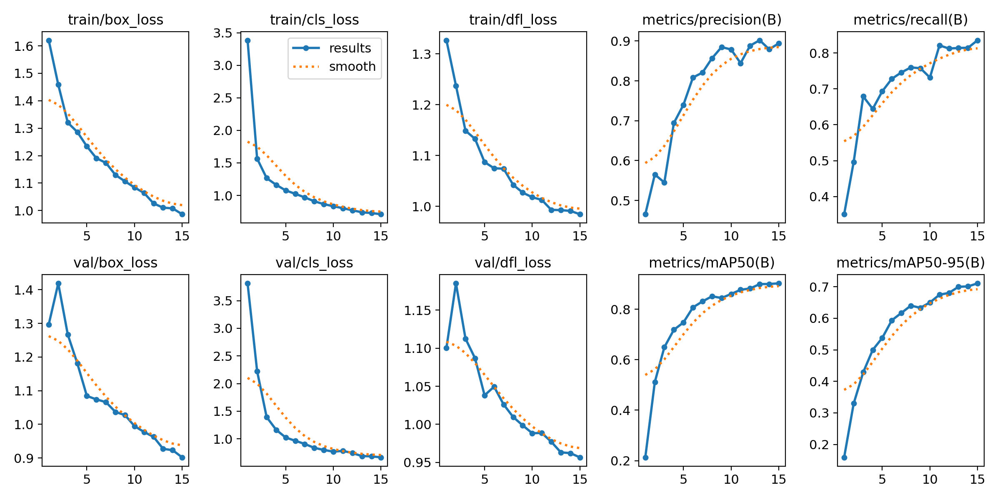

In [18]:
from IPython.display import Image, display

display(
    Image(
        filename="/content/runs/traffic_finetune/results.png",
        width=1000
    )
)

## 5. Model Evaluation

The best fine-tuned YOLO11 checkpoint is evaluated on the labeled validation split using the Ultralytics `model.val()` API.

The evaluation reports standard object-detection metrics:

- **Precision** — how often predicted vehicle detections are correct.
- **Recall** — how many ground-truth vehicles are successfully detected.
- **mAP50** — mean Average Precision at an IoU threshold of 0.50.
- **mAP50–95** — mean Average Precision averaged across IoU thresholds from 0.50 to 0.95.

Together, these metrics provide a quantitative assessment of the detector's accuracy and localization quality across the four vehicle classes.

In [19]:
from ultralytics import YOLO

best_model_path = "/content/runs/traffic_finetune/weights/best.pt"

best_model = YOLO(best_model_path)

val_results = best_model.val(
    data=data_yaml,
    split="val",
    plots=True
)

print("\n========== MODEL EVALUATION ==========")
print(f"Precision: {val_results.box.mp:.3f}")
print(f"Recall: {val_results.box.mr:.3f}")
print(f"mAP50: {val_results.box.map50:.3f}")
print(f"mAP50-95: {val_results.box.map:.3f}")

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2343.6±744.3 MB/s, size: 81.0 KB)
val: Scanning /content/Vehicle-Detection-1/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 41.9Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.7it/s 4.1s
                   all        100       1107      0.894      0.835      0.902       0.71
                   bus         35         37      0.947      0.865      0.916      0.839
                   car         92        366      0.905      0.899      0.951      0.741
             motorbike         90        611      0.888      0.727      0.834      0.495
                 truck         62         93      0.837      0.849      0.908      0.765
Speed: 6.3ms preprocess, 6.6ms infe

### 5.1 Evaluation Results and Interpretation

The best fine-tuned YOLO11 checkpoint was evaluated on the validation set containing **100 images and 1,107 labeled vehicle instances**.

The model achieved the following overall performance:

| Metric | Result |
|---|---:|
| Precision | **0.894** |
| Recall | **0.835** |
| mAP50 | **0.902** |
| mAP50–95 | **0.710** |

The **precision of 0.894** indicates that the majority of vehicle detections produced by the model are correct, with relatively few false-positive predictions.

The **recall of 0.835** indicates that the model successfully identifies most ground-truth vehicles, although some vehicles remain undetected. Since recall is lower than precision, missed detections represent a greater limitation than incorrect detections for this model.

The **mAP50 of 0.902** demonstrates strong overall vehicle-detection performance at an IoU threshold of 0.50.

The **mAP50–95 of 0.710** is lower because this metric evaluates predictions across increasingly strict IoU thresholds. This indicates that while the model generally identifies vehicles correctly, precise bounding-box localization becomes more challenging under stricter overlap requirements.

### Per-Class Performance

The model performs particularly well on **cars and buses**, with car detection reaching an mAP50 of **0.951** and bus detection reaching a precision of **0.947**.

The **motorbike** class presents the greatest challenge, with a recall of **0.727** and mAP50–95 of **0.495**. This suggests that motorbikes are more likely to be missed or less precisely localized than larger vehicle classes. Their smaller visual footprint, greater variation in appearance, and possible partial occlusion in traffic scenes may contribute to this behavior.

Overall, the results demonstrate that fine-tuning produced a strong vehicle detector suitable for the traffic-monitoring application while also revealing class-specific limitations that should be considered during deployment.

### 5.2 False Positives, False Negatives, and Threshold Selection

For a traffic-monitoring system, both **false positives (FP)** and **false negatives (FN)** affect the reliability of downstream traffic analytics.

A **false positive** occurs when the model predicts a vehicle where no corresponding vehicle exists. In this application, false positives may artificially increase vehicle counts and therefore overestimate traffic flow.

A **false negative** occurs when an actual vehicle is not detected. False negatives are particularly important for traffic monitoring because missed vehicles can lead to underestimated traffic volume. The validation recall of **0.835**, compared with the higher precision of **0.894**, indicates that missed detections are currently a greater limitation than incorrect detections.

#### Confidence Threshold

A confidence threshold controls the minimum prediction confidence required for a detection to be retained.

For the initial image-based detection and segmentation experiments, a confidence threshold of **0.25** was used to remove very low-confidence predictions while retaining reliable vehicle detections.

For the traffic video analytics pipeline, the threshold was reduced to **0.15** because vehicles near the vanishing point occupy fewer pixels and are more difficult to detect consistently. The lower threshold improves sensitivity to small and distant vehicles and reduces the risk of false negatives interrupting tracking trajectories.

This choice represents a trade-off: lowering the confidence threshold can improve recall but may also introduce additional false positives. For traffic-flow monitoring, retaining potential vehicles was prioritized because missed detections can interrupt tracking and cause vehicle-crossing events to be underestimated.

#### IoU and Localization Quality

Intersection over Union (IoU) measures the overlap between a predicted bounding box and its corresponding ground-truth box.

The evaluation reports **mAP50**, where detections are evaluated at an IoU threshold of 0.50, together with **mAP50–95**, which averages performance across increasingly strict IoU thresholds from 0.50 to 0.95.

The model achieved an **mAP50 of 0.902**, indicating strong detection performance when moderate bounding-box overlap is required. The lower **mAP50–95 of 0.710** shows that localization becomes more difficult as the overlap requirement becomes stricter.

For this traffic-monitoring use case, IoU = 0.50 provides a useful primary reference because correct vehicle identification is more important than extremely precise bounding-box alignment, while mAP50–95 provides a stricter measure of localization quality.

## 6. Model Deployment and Export

The best fine-tuned YOLO11 model is exported to the **ONNX (Open Neural Network Exchange)** format for deployment.

ONNX was selected because it provides a portable model representation that can be executed across multiple inference runtimes and hardware platforms without requiring the original Ultralytics/PyTorch training environment.

Exporting the trained checkpoint demonstrates the transition from model development and evaluation to a deployment-ready representation.

In [20]:
from ultralytics import YOLO
import os

best_model_path = "/content/runs/traffic_finetune/weights/best.pt"

deployment_model = YOLO(best_model_path)

onnx_path = deployment_model.export(
    format="onnx",
    imgsz=640
)

print("ONNX export completed successfully.")
print(f"Exported model: {onnx_path}")
print(f"File exists: {os.path.exists(onnx_path)}")

Ultralytics 8.4.118 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO11n summary (fused): 101 layers, 2,582,932 parameters, 0 gradients, 6.4 GFLOPs

PyTorch: starting from '/content/runs/traffic_finetune/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 8, 8400) (5.2 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 282ms
Prepared 4 packages in 1.80s
Installed 4 packages in 259ms
 + colorama==0.4.6
 + onnx==1.22.0
 + onnxruntime==1.28.0
 + onnxslim==0.1.95

requirements: AutoUpdate success ✅ 2.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.22.0 opset 20...
ONNX: slimmi